In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Image Style Transfer
The Goal for this project is to take two images, one stylised and artistic, the other simple and boring, and turn the latter into an exciting piece of art. All with the help of the magics of CNNs.

In [ ]:
## load the necessary libraries

import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

### Step 1: Loading and Preprocessing Images
### What’s Happening?

The function loads an image from the given path, resizes it to (224x224) pixels (standard for VGG-19), converts it to a numerical array, and preprocesses it using VGG-19's normalization requirements.


### Why?

Neural networks require normalized inputs for effective training. VGG-19 expects the image's RGB values to be adjusted based on specific mean values (for each color channel).


### Key Consideration:

The choice of image size balances computation speed with visual quality. Larger images take longer to process but result in better details.

In [ ]:
# Load and preprocess the images
def load_and_process_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img




### Step 2: Deprocessing the Image

### What’s Happening?

This reverses the preprocessing step to convert the image back to its original format for visualization.

###Why?

The model processes the image in a specific format, but we need a human-readable version to display results.

In [ ]:
# Deprocess the image
def deprocess_image(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

### Step 3: Using the pre-trained VGG-19 model

### What’s Happening?

The VGG-19 model is loaded without the final classification layer (include_top=False). Its pre-trained weights are frozen (trainable=False).


### Why?

We only need the features extracted by the convolutional layers, not the model's classification capabilities.
###Key Consideration:

Freezing the weights ensures the model's knowledge (from ImageNet) remains intact and prevents unnecessary computations.

In [ ]:
# Load the VGG19 model
def get_model():
    vgg = VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    return vgg


### Step 4: Selecting Content and Style Layers

### What’s Happening?

Content layers capture the structure of the content image, while style layers capture texture, patterns, and colors.

### Why These Layers?

Lower layers (e.g., block1_conv1) capture basic features like edges, while deeper layers (e.g., block5_conv2) capture more abstract structures.

### Key Consideration:

The choice of layers directly impacts the quality of style transfer. Using too many layers can increase computation and lead to overfitting.


In [ ]:
# Get the content and style layers
def get_content_and_style_layers():
    content_layers = ['block5_conv2']
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
    return content_layers, style_layers

### Step 5: Defining Loss Functions



In [ ]:
# Compute the content loss
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))
# Measures how much the content image’s structure is preserved.
# The smaller the loss, the better the match.

############################################################################################################
# Compute the gram matrix
def gram_matrix(input_tensor):
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a=True)
    return gram / tf.cast(n, tf.float32)
# Gram Matrix:
# Represents the relationships between features. It captures style information effectively.



############################################################################################################
# Compute the style loss
def compute_style_loss(base_style, gram_target):
    height, width, channels = base_style.get_shape().as_list()
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))
# Compares the Gram matrices of the style and generated images to measure the similarity in texture and patterns.




# Compute the total loss
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    style_weight, content_weight = loss_weights
    model_outputs = model(init_image)

    style_output_features = model_outputs[:len(gram_style_features)]
    content_output_features = model_outputs[len(gram_style_features):]

    style_score = 0
    content_score = 0

    weight_per_style_layer = 1.0 / float(len(gram_style_features))
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += weight_per_style_layer * compute_style_loss(comb_style[0], target_style)

    weight_per_content_layer = 1.0 / float(len(content_features))
    for target_content, comb_content in zip(content_features, content_output_features):
        content_score += weight_per_content_layer * compute_content_loss(comb_content[0], target_content)

    style_score *= style_weight
    content_score *= content_weight

    loss = style_score + content_score
    return loss, style_score, content_score



### Step 6: Optimising the results, and making of the Style transfer function

In [ ]:

# Perform style transfer
def style_transfer(content_path, style_path, num_iterations=1000, content_weight=1e3, style_weight=1e-2):
    model = get_model()
    content_layers, style_layers = get_content_and_style_layers()
    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    content_image = load_and_process_image(content_path)
    style_image = load_and_process_image(style_path)

    content_outputs = [model.get_layer(name).output for name in content_layers]
    style_outputs = [model.get_layer(name).output for name in style_layers]
    model_outputs = style_outputs + content_outputs

    model = Model(inputs=model.input, outputs=model_outputs)

    for layer in model.layers:
        layer.trainable = False

    style_features = [style_layer[0] for style_layer in model(style_image)[:num_style_layers]]
    content_features = [content_layer[0] for content_layer in model(content_image)[num_style_layers:]]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    init_image = tf.Variable(content_image, dtype=tf.float32)


    ### Optimizing the Image
    ### Adam optimizer minimizes the total loss (content + style loss) by updating the pixels of the output image.
    opt = tf.optimizers.Adam(learning_rate=5.0, beta_1=0.99, epsilon=1e-1)



    best_loss, best_img = float('inf'), None

    loss_weights = (style_weight, content_weight)



    ### Style Transfer Loop

    ### What’s Happening?
    ### The GradientTape computes the gradients of the loss with respect to the image.
    ### The optimizer updates the image iteratively to reduce the loss.

    ### Considerations:
    ### Iterations and learning rate must balance performance and quality. Too high a learning rate can lead to artifacts, while too low slows convergence.
    for i in range(num_iterations):
        with tf.GradientTape() as tape:
            all_loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
        loss = all_loss[0]
        grads = tape.gradient(loss, init_image)
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, -103.939, 255.0 - 103.939)
        init_image.assign(clipped)

        if loss < best_loss:
            best_loss = loss
            best_img = deprocess_image(init_image.numpy())

        if i % 100 == 0:
            print(f"Iteration: {i}, Total loss: {loss}, Style loss: {all_loss[1]}, Content loss: {all_loss[2]}")

    return best_img

### To view the results of the style transfer function in a more simple manner and see the before and after of the results

In [ ]:
def visualize_style_transfer(content_path, style_path):
    """
    Perform style transfer and visualize the content, style, and output images.

    Parameters:
        content_path (str): Path to the content image.
        style_path (str): Path to the style image.

    Returns:
        None
    """
    # Perform style transfer
    output_image = style_transfer(content_path, style_path)

    # Load the content and style images
    content_image = load_and_process_image(content_path)
    style_image = load_and_process_image(style_path)

    # Deprocess the images for visualization
    content_image = deprocess_image(content_image)
    style_image = deprocess_image(style_image)

    # Plot the images
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.title('Content Image')
    plt.imshow(content_image)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Style Image')
    plt.imshow(style_image)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Output Image')
    plt.imshow(output_image)
    plt.axis('off')

    plt.show()



80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
Iteration: 0, Total loss: 144928928.0, Style loss: 144928928.0, Content loss: 0.0
Iteration: 100, Total loss: 8640642.0, Style loss: 6580588.0, Content loss: 2060054.0
Iteration: 200, Total loss: 4762610.5, Style loss: 3136634.5, Content loss: 1625976.125
Iteration: 300, Total loss: 3260000.25, Style loss: 1952867.75, Content loss: 1307132.5
Iteration: 400, Total loss: 2542079.5, Style loss: 1432668.125, Content loss: 1109411.375
Iteration: 500, Total loss: 2154067.5, Style loss: 1172562.0, Content loss: 981505.5625
Iteration: 600, Total loss: 1923866.375, Style loss: 1014889.5625, Content loss: 908976.8125
Iteration: 700, Total loss: 1776365.0, Style loss: 909790.6875, Content loss: 866574.25
Iteration: 800, Total loss: 1672435.875, Style loss: 841657.0, Content loss: 830778.875
Iteration: 900, Total loss: 1598145.125, Style loss: 794262.8125, Content loss: 803882.3125


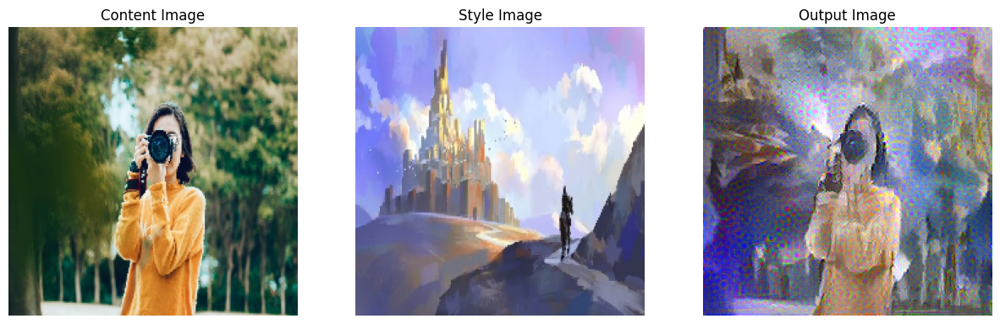

In [ ]:
# Example usage
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/landscape1.jpg'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 5360638976.0, Style loss: 5360638976.0, Content loss: 0.0
Iteration: 100, Total loss: 84956080.0, Style loss: 78156704.0, Content loss: 6799376.5
Iteration: 200, Total loss: 40585896.0, Style loss: 34083620.0, Content loss: 6502277.0
Iteration: 300, Total loss: 25412234.0, Style loss: 19331294.0, Content loss: 6080940.0
Iteration: 400, Total loss: 18468282.0, Style loss: 12929176.0, Content loss: 5539106.0
Iteration: 500, Total loss: 15044544.0, Style loss: 9901416.0, Content loss: 5143128.0
Iteration: 600, Total loss: 13061812.0, Style loss: 8254230.0, Content loss: 4807582.0
Iteration: 700, Total loss: 11778098.0, Style loss: 7252814.5, Content loss: 4525284.0
Iteration: 800, Total loss: 10887244.0, Style loss: 6553269.5, Content loss: 4333975.0
Iteration: 900, Total loss: 10221563.0, Style loss: 6029381.0, Content loss: 4192181.75


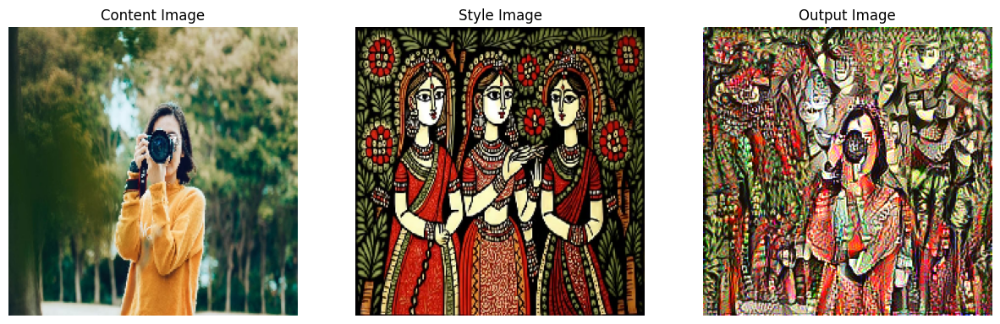

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/indian.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 667286080.0, Style loss: 667286080.0, Content loss: 0.0
Iteration: 100, Total loss: 13927452.0, Style loss: 10384066.0, Content loss: 3543385.75
Iteration: 200, Total loss: 7483258.0, Style loss: 4455593.5, Content loss: 3027664.5
Iteration: 300, Total loss: 4820385.0, Style loss: 2261244.25, Content loss: 2559141.0
Iteration: 400, Total loss: 3626357.5, Style loss: 1457053.375, Content loss: 2169304.25
Iteration: 500, Total loss: 2995866.75, Style loss: 1121655.0, Content loss: 1874211.75
Iteration: 600, Total loss: 2609104.25, Style loss: 958066.375, Content loss: 1651037.875
Iteration: 700, Total loss: 2360983.0, Style loss: 861646.0, Content loss: 1499337.0
Iteration: 800, Total loss: 2195075.5, Style loss: 788411.0, Content loss: 1406664.625
Iteration: 900, Total loss: 2069732.5, Style loss: 740261.5, Content loss: 1329471.0


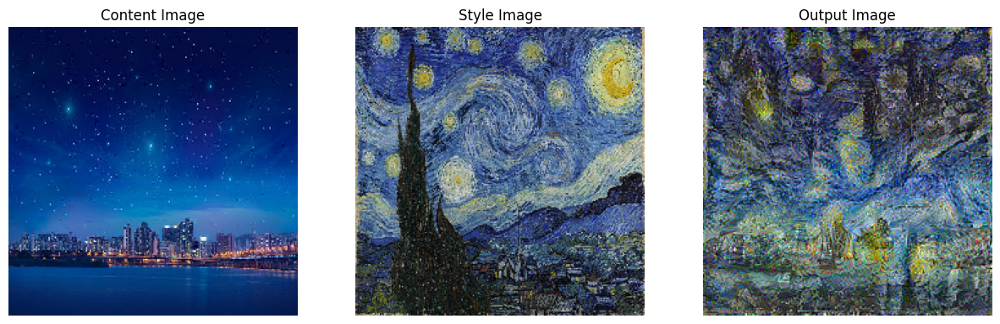

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/stars.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/starrynight.jpg'
visualize_style_transfer(content_path, style_path)

## Initial observations
The images do seem take on the Style of the images being fed to them, but the style isn't applied all that clearly, nor does it seem interesting. Perhaps we can fine tune this so that it can do this in a manner that seems more intentional.

Going to try and increase the content weight, and decrease the style weight to see if that yeilds better results

In [ ]:
# Perform style transfer
def style_transfer(content_path, style_path, num_iterations=1000, content_weight=1e4, style_weight=1e-3):
    model = get_model()
    content_layers, style_layers = get_content_and_style_layers()
    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    content_image = load_and_process_image(content_path)
    style_image = load_and_process_image(style_path)

    content_outputs = [model.get_layer(name).output for name in content_layers]
    style_outputs = [model.get_layer(name).output for name in style_layers]
    model_outputs = style_outputs + content_outputs

    model = Model(inputs=model.input, outputs=model_outputs)

    for layer in model.layers:
        layer.trainable = False

    style_features = [style_layer[0] for style_layer in model(style_image)[:num_style_layers]]
    content_features = [content_layer[0] for content_layer in model(content_image)[num_style_layers:]]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    init_image = tf.Variable(content_image, dtype=tf.float32)
    opt = tf.optimizers.Adam(learning_rate=5.0, beta_1=0.99, epsilon=1e-1)

    best_loss, best_img = float('inf'), None

    loss_weights = (style_weight, content_weight)

    for i in range(num_iterations):
        with tf.GradientTape() as tape:
            all_loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
        loss = all_loss[0]
        grads = tape.gradient(loss, init_image)
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, -103.939, 255.0 - 103.939)
        init_image.assign(clipped)

        if loss < best_loss:
            best_loss = loss
            best_img = deprocess_image(init_image.numpy())

        if i % 100 == 0:
            print(f"Iteration: {i}, Total loss: {loss}, Style loss: {all_loss[1]}, Content loss: {all_loss[2]}")

    return best_img



Iteration: 0, Total loss: 536063968.0, Style loss: 536063968.0, Content loss: 0.0
Iteration: 100, Total loss: 23496424.0, Style loss: 10601929.0, Content loss: 12894495.0
Iteration: 200, Total loss: 14675354.0, Style loss: 6291682.5, Content loss: 8383672.0
Iteration: 300, Total loss: 11279095.0, Style loss: 4728916.0, Content loss: 6550179.0
Iteration: 400, Total loss: 9507264.0, Style loss: 3925369.5, Content loss: 5581894.0
Iteration: 500, Total loss: 8427636.0, Style loss: 3497896.0, Content loss: 4929740.0
Iteration: 600, Total loss: 7773631.0, Style loss: 3234974.25, Content loss: 4538656.5
Iteration: 700, Total loss: 7305821.0, Style loss: 3058133.25, Content loss: 4247688.0
Iteration: 800, Total loss: 6981250.0, Style loss: 2928920.5, Content loss: 4052329.5
Iteration: 900, Total loss: 6739543.0, Style loss: 2835595.0, Content loss: 3903947.75


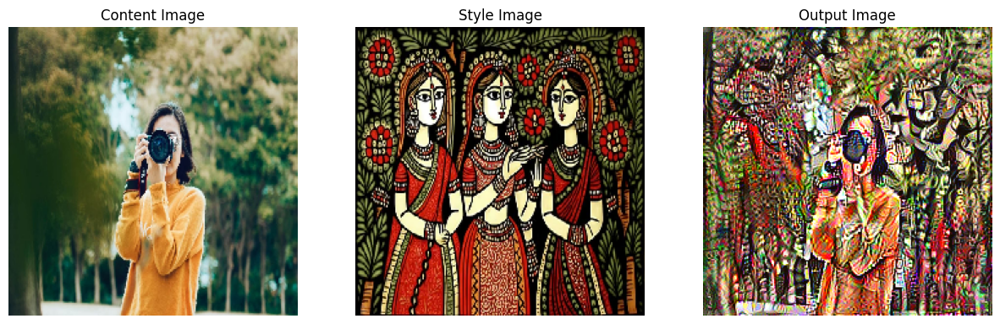

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/indian.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 66728612.0, Style loss: 66728612.0, Content loss: 0.0
Iteration: 100, Total loss: 5806632.0, Style loss: 2194254.0, Content loss: 3612378.0
Iteration: 200, Total loss: 3979430.75, Style loss: 1504848.0, Content loss: 2474582.75
Iteration: 300, Total loss: 3194583.0, Style loss: 1207767.75, Content loss: 1986815.125
Iteration: 400, Total loss: 2769838.0, Style loss: 1050172.25, Content loss: 1719665.875
Iteration: 500, Total loss: 2526627.0, Style loss: 962891.125, Content loss: 1563735.75
Iteration: 600, Total loss: 2365509.75, Style loss: 911055.125, Content loss: 1454454.625
Iteration: 700, Total loss: 2256386.5, Style loss: 879444.5, Content loss: 1376942.0
Iteration: 800, Total loss: 2180529.5, Style loss: 848542.4375, Content loss: 1331987.0
Iteration: 900, Total loss: 2125475.25, Style loss: 830906.1875, Content loss: 1294569.0


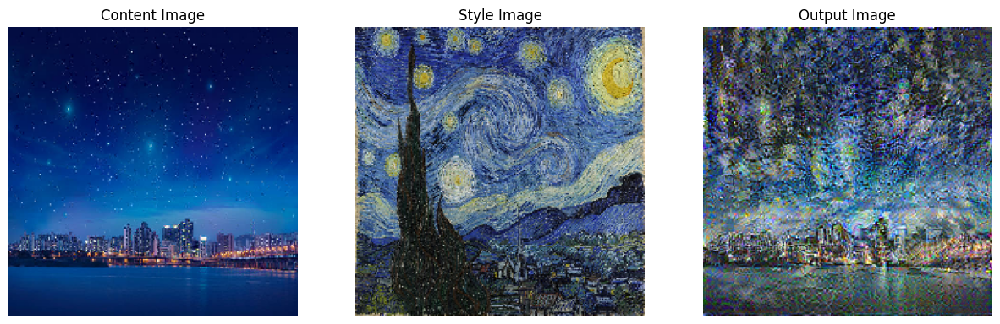

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/stars.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/starrynight.jpg'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 29895430.0, Style loss: 29895430.0, Content loss: 0.0
Iteration: 100, Total loss: 3840557.5, Style loss: 1905934.0, Content loss: 1934623.625
Iteration: 200, Total loss: 2633396.0, Style loss: 1296372.0, Content loss: 1337023.875
Iteration: 300, Total loss: 2173975.25, Style loss: 1076869.125, Content loss: 1097106.125
Iteration: 400, Total loss: 1938472.625, Style loss: 972046.25, Content loss: 966426.375
Iteration: 500, Total loss: 1806484.25, Style loss: 912728.625, Content loss: 893755.5625
Iteration: 600, Total loss: 1729075.75, Style loss: 872740.0, Content loss: 856335.8125
Iteration: 700, Total loss: 1681102.0, Style loss: 853976.25, Content loss: 827125.6875
Iteration: 800, Total loss: 1646636.375, Style loss: 836701.75, Content loss: 809934.625
Iteration: 900, Total loss: 1621554.0, Style loss: 825463.625, Content loss: 796090.375


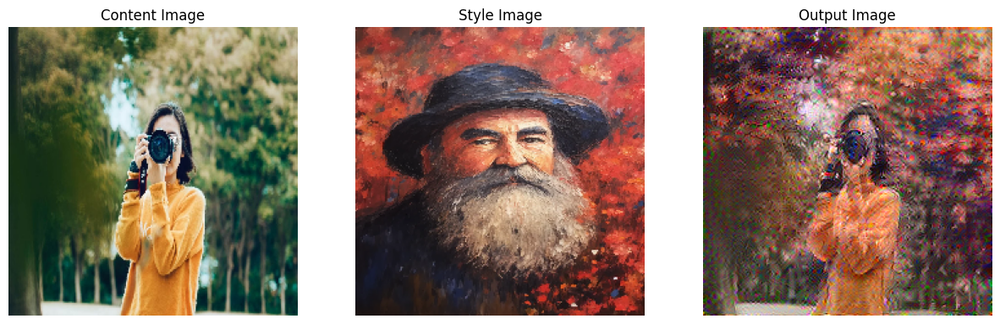

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/portraits.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 14492894.0, Style loss: 14492894.0, Content loss: 0.0
Iteration: 100, Total loss: 3000945.0, Style loss: 1950920.25, Content loss: 1050024.75
Iteration: 200, Total loss: 2065193.0, Style loss: 1293200.875, Content loss: 771992.1875
Iteration: 300, Total loss: 1660883.5, Style loss: 1009460.375, Content loss: 651423.125
Iteration: 400, Total loss: 1452234.5, Style loss: 861682.5, Content loss: 590552.0
Iteration: 500, Total loss: 1343617.875, Style loss: 784088.4375, Content loss: 559529.4375
Iteration: 600, Total loss: 1270195.375, Style loss: 733830.6875, Content loss: 536364.6875
Iteration: 700, Total loss: 1225194.5, Style loss: 701706.8125, Content loss: 523487.75
Iteration: 800, Total loss: 1192665.75, Style loss: 681318.4375, Content loss: 511347.34375
Iteration: 900, Total loss: 1173611.25, Style loss: 667205.0, Content loss: 506406.25


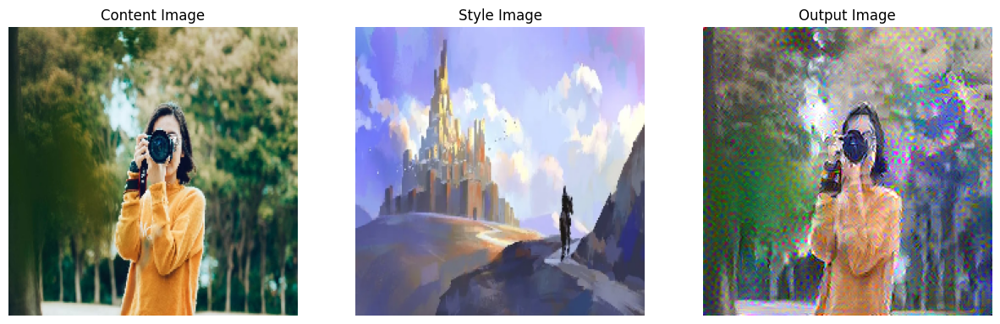

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/landscape1.jpg'
visualize_style_transfer(content_path, style_path)

Okayyy, that looks amazing

Let's try the opposite, just for fun

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

# Load and preprocess the images
def load_and_process_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return img

# Deprocess the image
def deprocess_image(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# Load the VGG19 model
def get_model():
    vgg = VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    return vgg

# Get the content and style layers
def get_content_and_style_layers():
    content_layers = ['block5_conv2']
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
    return content_layers, style_layers

# Compute the content loss
def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

# Compute the gram matrix
def gram_matrix(input_tensor):
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a=True)
    return gram / tf.cast(n, tf.float32)

# Compute the style loss
def compute_style_loss(base_style, gram_target):
    height, width, channels = base_style.get_shape().as_list()
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

# Compute the total loss
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    style_weight, content_weight = loss_weights
    model_outputs = model(init_image)

    style_output_features = model_outputs[:len(gram_style_features)]
    content_output_features = model_outputs[len(gram_style_features):]

    style_score = 0
    content_score = 0

    weight_per_style_layer = 1.0 / float(len(gram_style_features))
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += weight_per_style_layer * compute_style_loss(comb_style[0], target_style)

    weight_per_content_layer = 1.0 / float(len(content_features))
    for target_content, comb_content in zip(content_features, content_output_features):
        content_score += weight_per_content_layer * compute_content_loss(comb_content[0], target_content)

    style_score *= style_weight
    content_score *= content_weight

    loss = style_score + content_score
    return loss, style_score, content_score

# Perform style transfer
def style_transfer(content_path, style_path, num_iterations=1000, content_weight=1e2, style_weight=1e-3):
    model = get_model()
    content_layers, style_layers = get_content_and_style_layers()
    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    content_image = load_and_process_image(content_path)
    style_image = load_and_process_image(style_path)

    content_outputs = [model.get_layer(name).output for name in content_layers]
    style_outputs = [model.get_layer(name).output for name in style_layers]
    model_outputs = style_outputs + content_outputs

    model = Model(inputs=model.input, outputs=model_outputs)

    for layer in model.layers:
        layer.trainable = False

    style_features = [style_layer[0] for style_layer in model(style_image)[:num_style_layers]]
    content_features = [content_layer[0] for content_layer in model(content_image)[num_style_layers:]]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    init_image = tf.Variable(content_image, dtype=tf.float32)
    opt = tf.optimizers.Adam(learning_rate=5.0, beta_1=0.99, epsilon=1e-1)

    best_loss, best_img = float('inf'), None

    loss_weights = (style_weight, content_weight)

    for i in range(num_iterations):
        with tf.GradientTape() as tape:
            all_loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
        loss = all_loss[0]
        grads = tape.gradient(loss, init_image)
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, -103.939, 255.0 - 103.939)
        init_image.assign(clipped)

        if loss < best_loss:
            best_loss = loss
            best_img = deprocess_image(init_image.numpy())

        if i % 100 == 0:
            print(f"Iteration: {i}, Total loss: {loss}, Style loss: {all_loss[1]}, Content loss: {all_loss[2]}")

    return best_img



Iteration: 0, Total loss: 536063968.0, Style loss: 536063968.0, Content loss: 0.0
Iteration: 100, Total loss: 8472366.0, Style loss: 7791392.5, Content loss: 680973.3125
Iteration: 200, Total loss: 4097398.0, Style loss: 3453045.5, Content loss: 644352.375
Iteration: 300, Total loss: 2565887.75, Style loss: 1973832.875, Content loss: 592054.9375
Iteration: 400, Total loss: 1883223.25, Style loss: 1336958.625, Content loss: 546264.5625
Iteration: 500, Total loss: 1522429.0, Style loss: 1020262.375, Content loss: 502166.59375
Iteration: 600, Total loss: 1312842.5, Style loss: 844818.125, Content loss: 468024.3125
Iteration: 700, Total loss: 1178168.0, Style loss: 733953.75, Content loss: 444214.3125
Iteration: 800, Total loss: 1084494.25, Style loss: 660484.125, Content loss: 424010.0625
Iteration: 900, Total loss: 1016427.75, Style loss: 609009.3125, Content loss: 407418.4375


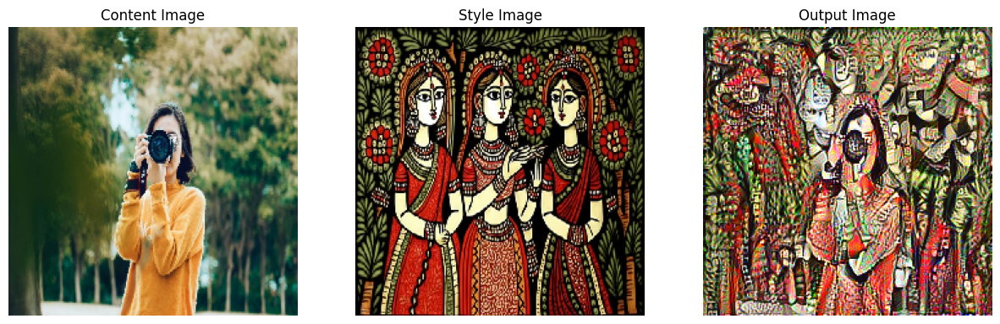

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/indian.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 66728612.0, Style loss: 66728612.0, Content loss: 0.0
Iteration: 100, Total loss: 1392355.25, Style loss: 1039140.25, Content loss: 353214.96875
Iteration: 200, Total loss: 752590.375, Style loss: 446578.78125, Content loss: 306011.5625
Iteration: 300, Total loss: 488072.125, Style loss: 230321.90625, Content loss: 257750.21875
Iteration: 400, Total loss: 366125.5, Style loss: 145643.75, Content loss: 220481.734375
Iteration: 500, Total loss: 302375.1875, Style loss: 112586.7578125, Content loss: 189788.4375
Iteration: 600, Total loss: 262126.5625, Style loss: 95911.6328125, Content loss: 166214.921875
Iteration: 700, Total loss: 236807.9375, Style loss: 86262.9765625, Content loss: 150544.953125
Iteration: 800, Total loss: 219278.4375, Style loss: 79709.1171875, Content loss: 139569.328125
Iteration: 900, Total loss: 206890.328125, Style loss: 74768.0, Content loss: 132122.328125


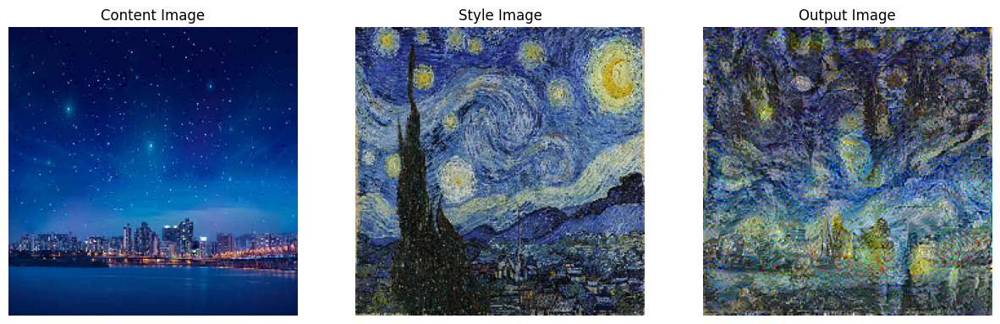

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/stars.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/starrynight.jpg'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 29895430.0, Style loss: 29895430.0, Content loss: 0.0
Iteration: 100, Total loss: 912640.0, Style loss: 580540.125, Content loss: 332099.90625
Iteration: 200, Total loss: 489366.875, Style loss: 260499.5, Content loss: 228867.375
Iteration: 300, Total loss: 332829.1875, Style loss: 158366.421875, Content loss: 174462.75
Iteration: 400, Total loss: 261281.8125, Style loss: 120378.6875, Content loss: 140903.125
Iteration: 500, Total loss: 223178.109375, Style loss: 101960.15625, Content loss: 121217.953125
Iteration: 600, Total loss: 202073.9375, Style loss: 90470.6953125, Content loss: 111603.234375
Iteration: 700, Total loss: 188688.375, Style loss: 84011.265625, Content loss: 104677.1015625
Iteration: 800, Total loss: 179637.84375, Style loss: 79286.125, Content loss: 100351.71875
Iteration: 900, Total loss: 173302.25, Style loss: 76029.40625, Content loss: 97272.8359375


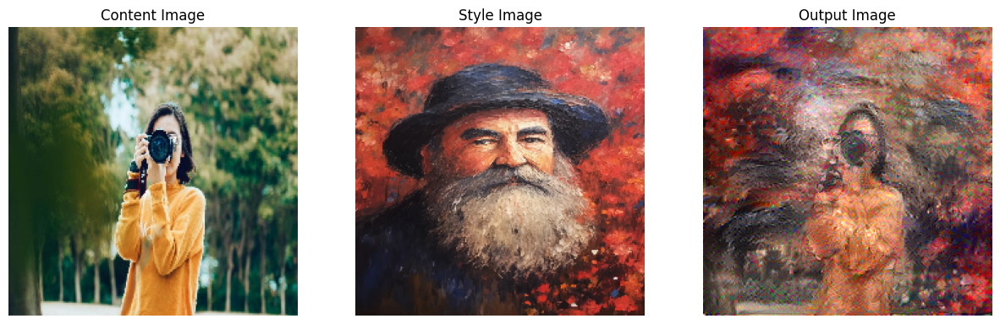

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/portraits.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 14492894.0, Style loss: 14492894.0, Content loss: 0.0
Iteration: 100, Total loss: 876534.0625, Style loss: 669951.375, Content loss: 206582.671875
Iteration: 200, Total loss: 478917.75, Style loss: 317563.625, Content loss: 161354.109375
Iteration: 300, Total loss: 328158.6875, Style loss: 195147.171875, Content loss: 133011.53125
Iteration: 400, Total loss: 257886.265625, Style loss: 145136.890625, Content loss: 112749.375
Iteration: 500, Total loss: 219325.859375, Style loss: 119290.4765625, Content loss: 100035.3828125
Iteration: 600, Total loss: 195753.96875, Style loss: 104487.484375, Content loss: 91266.484375
Iteration: 700, Total loss: 179954.96875, Style loss: 94508.1796875, Content loss: 85446.796875
Iteration: 800, Total loss: 169356.484375, Style loss: 87369.609375, Content loss: 81986.875
Iteration: 900, Total loss: 161612.59375, Style loss: 82516.921875, Content loss: 79095.6640625


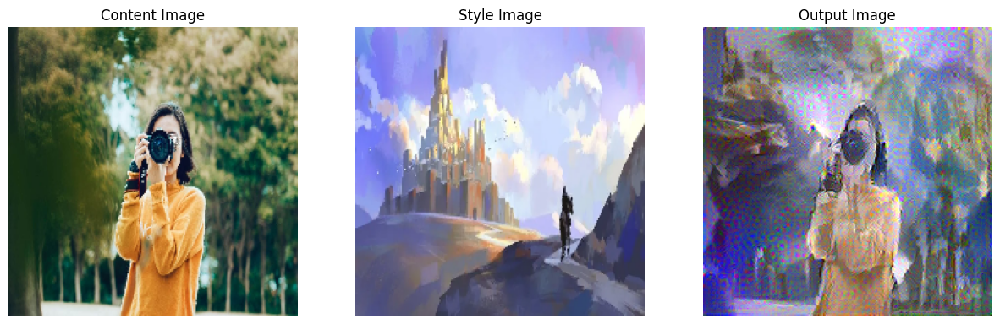

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/landscape1.jpg'
visualize_style_transfer(content_path, style_path)

Looks more stylised, but the clarity of the orignal is getting lost.

Either are good results, and the difference in loss can be altered for artistic preference.

### Let's try to Improve the results (not in video demo)

By further increasing the content weight and reducing the style weight
|

In [ ]:
# Perform style transfer
def style_transfer(content_path, style_path, num_iterations=1000, content_weight=1e5, style_weight=1e-4):
    model = get_model()
    content_layers, style_layers = get_content_and_style_layers()
    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    content_image = load_and_process_image(content_path)
    style_image = load_and_process_image(style_path)

    content_outputs = [model.get_layer(name).output for name in content_layers]
    style_outputs = [model.get_layer(name).output for name in style_layers]
    model_outputs = style_outputs + content_outputs

    model = Model(inputs=model.input, outputs=model_outputs)

    for layer in model.layers:
        layer.trainable = False

    style_features = [style_layer[0] for style_layer in model(style_image)[:num_style_layers]]
    content_features = [content_layer[0] for content_layer in model(content_image)[num_style_layers:]]
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]

    init_image = tf.Variable(content_image, dtype=tf.float32)
    opt = tf.optimizers.Adam(learning_rate=5.0, beta_1=0.99, epsilon=1e-1)

    best_loss, best_img = float('inf'), None

    loss_weights = (style_weight, content_weight)

    for i in range(num_iterations):
        with tf.GradientTape() as tape:
            all_loss = compute_loss(model, loss_weights, init_image, gram_style_features, content_features)
        loss = all_loss[0]
        grads = tape.gradient(loss, init_image)
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, -103.939, 255.0 - 103.939)
        init_image.assign(clipped)

        if loss < best_loss:
            best_loss = loss
            best_img = deprocess_image(init_image.numpy())

        if i % 100 == 0:
            print(f"Iteration: {i}, Total loss: {loss}, Style loss: {all_loss[1]}, Content loss: {all_loss[2]}")

    return best_img

Iteration: 0, Total loss: 53606392.0, Style loss: 53606392.0, Content loss: 0.0
Iteration: 100, Total loss: 25280242.0, Style loss: 11024128.0, Content loss: 14256114.0
Iteration: 200, Total loss: 17853806.0, Style loss: 7612405.0, Content loss: 10241401.0
Iteration: 300, Total loss: 14419454.0, Style loss: 6136582.5, Content loss: 8282872.0
Iteration: 400, Total loss: 12440667.0, Style loss: 5258069.5, Content loss: 7182597.5
Iteration: 500, Total loss: 11167098.0, Style loss: 4712059.0, Content loss: 6455039.0
Iteration: 600, Total loss: 10290842.0, Style loss: 4335744.0, Content loss: 5955098.0
Iteration: 700, Total loss: 9663028.0, Style loss: 4105751.25, Content loss: 5557276.5
Iteration: 800, Total loss: 9201989.0, Style loss: 3925763.5, Content loss: 5276225.5
Iteration: 900, Total loss: 8853870.0, Style loss: 3778521.75, Content loss: 5075348.5


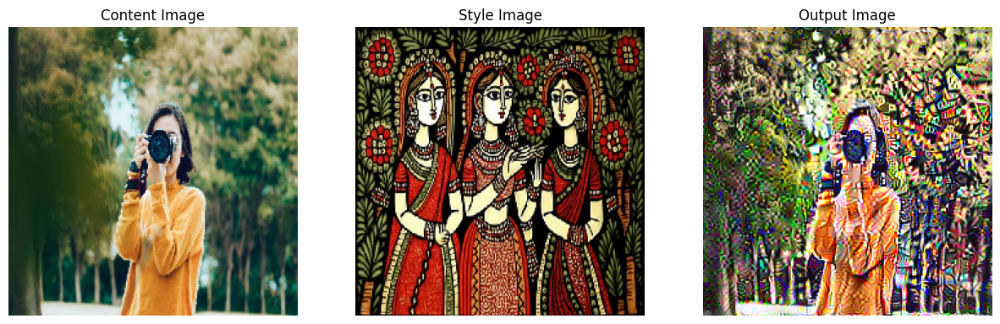

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/images.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/indian.webp'
visualize_style_transfer(content_path, style_path)

Iteration: 0, Total loss: 6672860.5, Style loss: 6672860.5, Content loss: 0.0
Iteration: 100, Total loss: 14282465.0, Style loss: 6100664.0, Content loss: 8181801.0
Iteration: 200, Total loss: 8071722.5, Style loss: 3419465.5, Content loss: 4652257.0
Iteration: 300, Total loss: 5585573.0, Style loss: 2498100.5, Content loss: 3087472.25
Iteration: 400, Total loss: 4341574.0, Style loss: 2137208.0, Content loss: 2204366.25
Iteration: 500, Total loss: 3675920.0, Style loss: 1936318.0, Content loss: 1739602.125
Iteration: 600, Total loss: 3287090.75, Style loss: 1812296.0, Content loss: 1474794.75
Iteration: 700, Total loss: 3029088.5, Style loss: 1712564.125, Content loss: 1316524.375
Iteration: 800, Total loss: 2847652.5, Style loss: 1636187.625, Content loss: 1211465.0
Iteration: 900, Total loss: 2716382.5, Style loss: 1578520.0, Content loss: 1137862.5


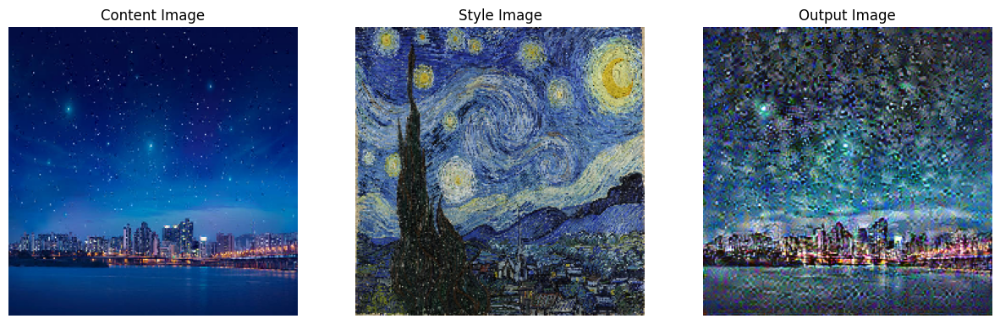

In [ ]:
content_path = '/content/drive/MyDrive/Project/Images/stars.jpg'
style_path = '/content/drive/MyDrive/Project/PaintingStyles/starrynight.jpg'
visualize_style_transfer(content_path, style_path)